# Tugas Lab 4 Pengolahan Citra
**Nama: Ghifari Aulia Azhar Riza**  
**NPM: 1906306773**

In [1]:
from skimage import io, util, color, filters, morphology, exposure
import cv2
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## 1. [50] Diberikan citra “carrot.jpg” yang direpresentasikan dalam color space CMY.

### a. Konversikan citra ini ke dalam color space RGB, lalu tampilkan hasil smoothing terhadap masing-masing channel dengan kernel 4x4.

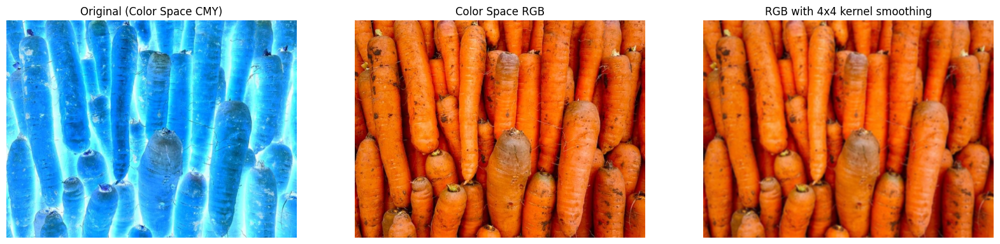

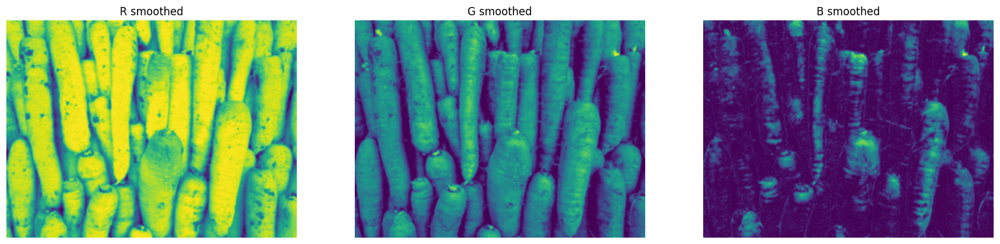

In [2]:
carrot = io.imread('carrot.jpg')

# CMY
C = carrot[:,:,0]
M = carrot[:,:,1]
Y = carrot[:,:,2]

# Convert CMY to RGB
R = (1 - util.img_as_float(C))
G = (1 - util.img_as_float(M))
B = (1 - util.img_as_float(Y))

# Create image
RGB = np.zeros(carrot.shape)
RGB[:,:,0] = R
RGB[:,:,1] = G
RGB[:,:,2] = B

# Smoothing to each channel
R1 = filters.rank.mean(R, morphology.square(4))
G1 = filters.rank.mean(G, morphology.square(4))
B1 = filters.rank.mean(B, morphology.square(4))

# Create image
RGB1 = util.img_as_ubyte(np.zeros(carrot.shape))
RGB1[:,:,0] = R1
RGB1[:,:,1] = G1
RGB1[:,:,2] = B1

# Show image
plt.figure(figsize=(20,10))
plt.subplot(1, 3, 1)
plt.title("Original (Color Space CMY)")
plt.imshow(carrot, cmap="gray")
plt.axis('off')
plt.subplot(1, 3, 2)
plt.title("Color Space RGB")
plt.imshow(RGB, cmap="gray")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.title("RGB with 4x4 kernel smoothing")
plt.imshow(RGB1, cmap="gray")
plt.axis("off")
plt.show()

# Each channel image with smoothing
plt.figure(figsize=(20,10))
plt.subplot(1, 3, 1)
plt.title("R smoothed")
plt.imshow(R1)
plt.axis('off')
plt.subplot(1, 3, 2)
plt.title("G smoothed")
plt.imshow(G1)
plt.axis("off")
plt.subplot(1, 3, 3)
plt.title("B smoothed")
plt.imshow(B1)
plt.axis("off")
plt.show()

### b. Konversikan citra ini ke dalam color space RGB, lalu tampilkan hasil smoothing terhadap masing-masing channel dengan kernel 16x16.

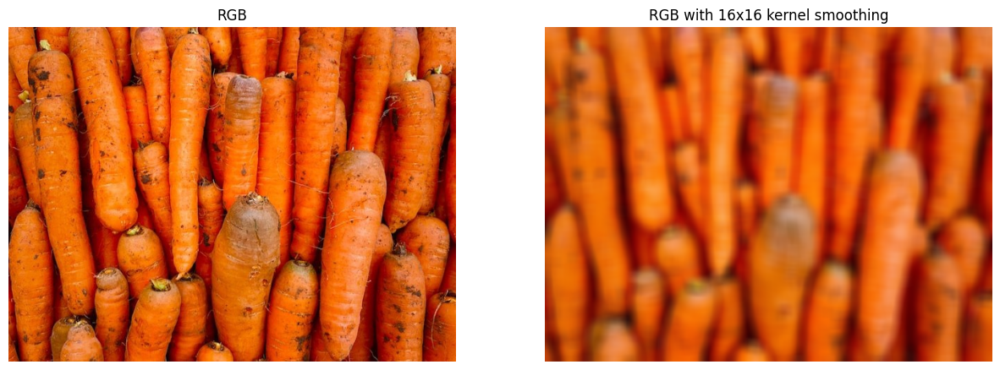

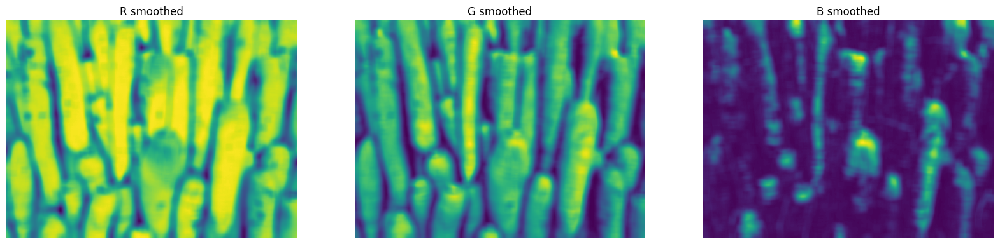

In [3]:
# Smoothing to each channel
R2 = filters.rank.mean(R, morphology.square(16))
G2 = filters.rank.mean(G, morphology.square(16))
B2 = filters.rank.mean(B, morphology.square(16))

# Create image
RGB2 = util.img_as_ubyte(np.zeros(carrot.shape))
RGB2[:,:,0] = R2
RGB2[:,:,1] = G2
RGB2[:,:,2] = B2

# show image
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.title("RGB")
plt.imshow(RGB)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("RGB with 16x16 kernel smoothing")
plt.imshow(RGB2)
plt.axis("off")
plt.show()

# Each channel image with smoothing
plt.figure(figsize=(20,10))
plt.subplot(1, 3, 1)
plt.title("R smoothed")
plt.imshow(R2)
plt.axis('off')
plt.subplot(1, 3, 2)
plt.title("G smoothed")
plt.imshow(G2)
plt.axis("off")
plt.subplot(1, 3, 3)
plt.title("B smoothed")
plt.imshow(B2)
plt.axis("off")
plt.show()

### c. Gabungkan masing-masing channel pada poin a dan b, kemudian bandingkan hasil citranya. Jelaskan hasil yang anda peroleh.

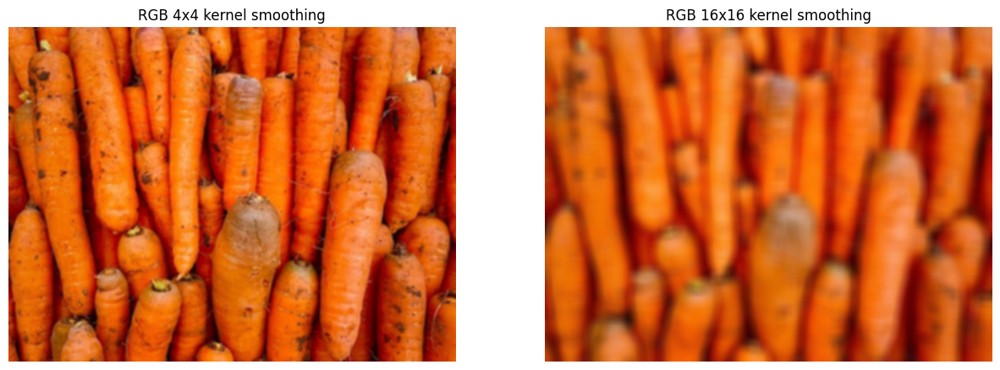

In [4]:
# show image
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.title("RGB 4x4 kernel smoothing")
plt.imshow(RGB1)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("RGB 16x16 kernel smoothing")
plt.imshow(RGB2)
plt.axis("off")
plt.show()

Berdasarkan hasil yang didapatkan di atas, gambar pada poin b terlihat lebih blur dibandingkan dengan gambar pada poin a. Hal ini dikarenakan kernel 16x16 meng-cover lebih banyak area dibandingkan dengan kernel 4x4 sehingga hasil pada poin b terlihat lebih blur.

### d. Lakukan clustering pada citra awal menggunakan metode k-mean clustering dengan k = 2.

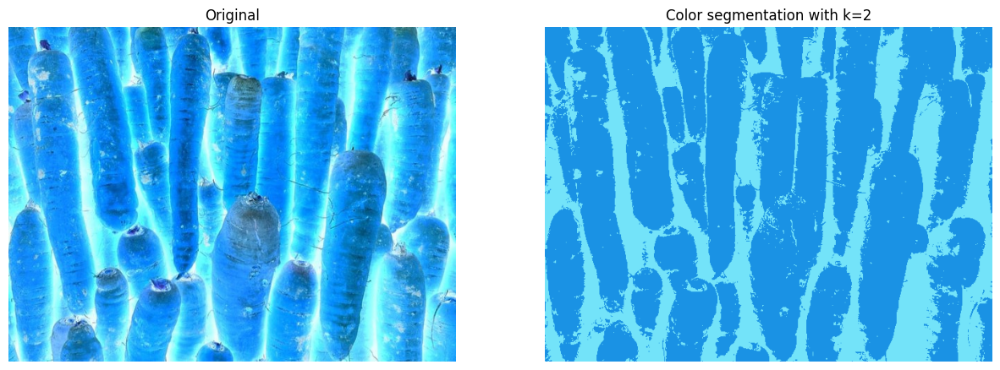

In [5]:
# Read image
carrot_2 = cv2.imread("carrot.jpg")
carrot_2 = cv2.cvtColor(carrot_2, cv2.COLOR_BGR2RGB)

# K-mean clustering
pixel_values = carrot_2.reshape((-1, 3))
pixel_values = np.float32(pixel_values)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 2
_, labels, (centers) = cv2.kmeans(pixel_values, k, None,
criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
centers = np.uint8(centers)
labels = labels.flatten()
segmented_image1 = centers[labels.flatten()]
segmented_image1 = segmented_image1.reshape(carrot_2.shape)

# show image
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(carrot_2)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("Color segmentation with k=2")
plt.imshow(segmented_image1)
plt.axis("off")
plt.show()

### e. Lakukan clustering pada citra awal menggunakan metode k-mean clustering dengan k = 5.

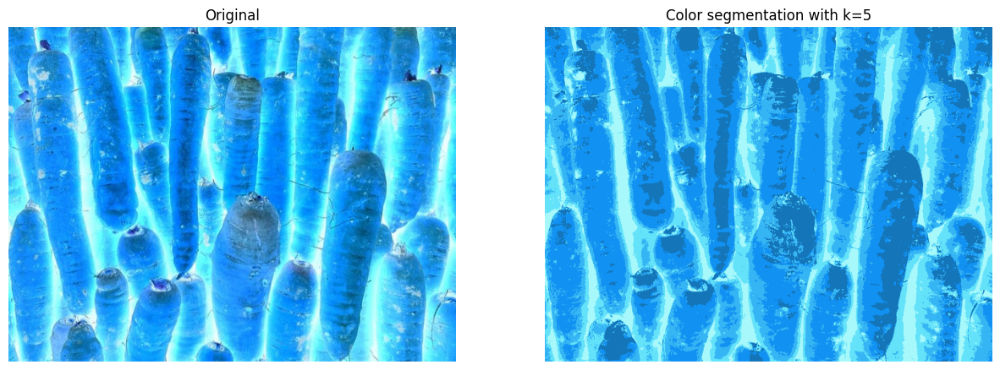

In [6]:
# K-mean clustering
pixel_values = carrot_2.reshape((-1, 3))
pixel_values = np.float32(pixel_values)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 5
_, labels, (centers) = cv2.kmeans(pixel_values, k, None,
criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
centers = np.uint8(centers)
labels = labels.flatten()
segmented_image2 = centers[labels.flatten()]
segmented_image2 = segmented_image2.reshape(carrot_2.shape)

# show image
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(carrot_2)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("Color segmentation with k=5")
plt.imshow(segmented_image2)
plt.axis("off")
plt.show()

### f. Ceritakan perbedaan yang kamu dapatkan pada poin d dan e. Nilai k manakah yang lebih baik untuk segmentasi gambar tersebut? Jelaskan alasan di balik jawaban anda!

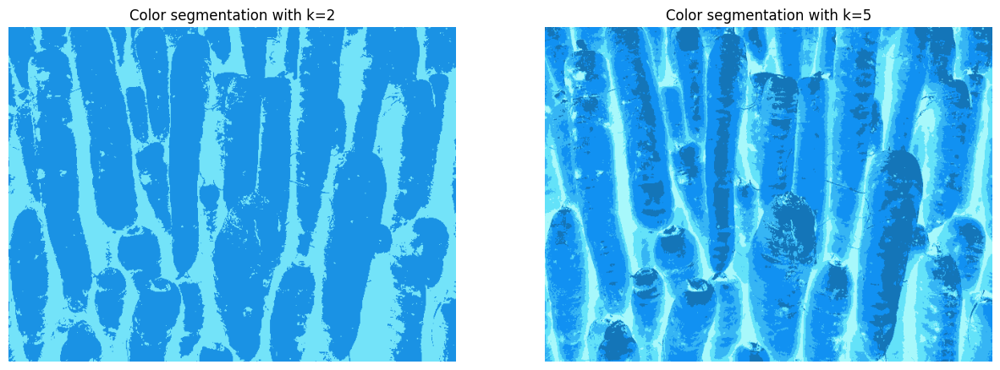

In [7]:
# show image
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.title("Color segmentation with k=2")
plt.imshow(segmented_image1)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("Color segmentation with k=5")
plt.imshow(segmented_image2)
plt.axis("off")
plt.show()

Berdasarkan hasil di atas, gambar pada poin e memiliki segmen yang lebih detail dibandingkan dengan gambar pada poin d. Gambar e memiliki k = 5, sedangkan gambar d memiliki k = 2. Sehingga ini membuat gambar e memiliki segmentasi yang lebih detail.

## 2. [50] Diberikan citra “bird-house.jpg”.

### a. Terapkan sharpening pada gambar tersebut untuk ketiga channel R, G, dan B.

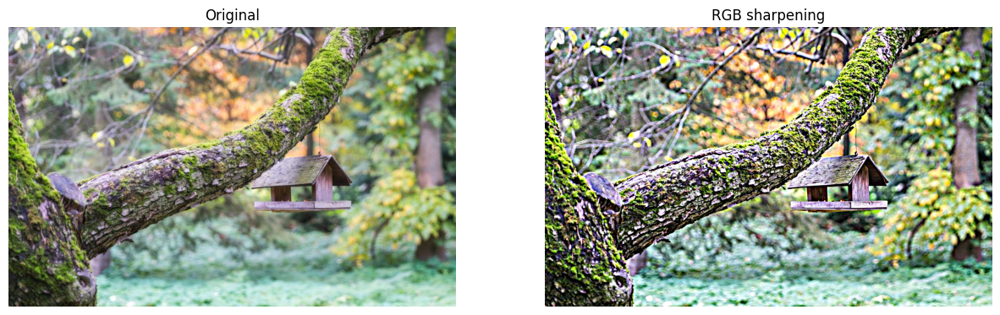

In [8]:
bird_house = io.imread('bird-house.jpg')

R = bird_house[:,:,0]
G = bird_house[:,:,1]
B = bird_house[:,:,2]

# Sharpening each channel
sharp_R = util.img_as_ubyte(filters.unsharp_mask(R, 5, 2))
sharp_G = util.img_as_ubyte(filters.unsharp_mask(G, 5, 2))
sharp_B = util.img_as_ubyte(filters.unsharp_mask(B, 5, 2))

# Combine channels
sharp_RGB = util.img_as_ubyte(np.zeros(bird_house.shape))
sharp_RGB[:,:,0] = sharp_R
sharp_RGB[:,:,1] = sharp_G
sharp_RGB[:,:,2] = sharp_B

# show image
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(bird_house)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("RGB sharpening")
plt.imshow(sharp_RGB)
plt.axis("off")
plt.show()

### b. Terapkan contrast stretching terhadap channel R, G, dan B lalu tampilkan hasilnya sebagai satu citra! Jelaskan hasil citra yang anda peroleh.

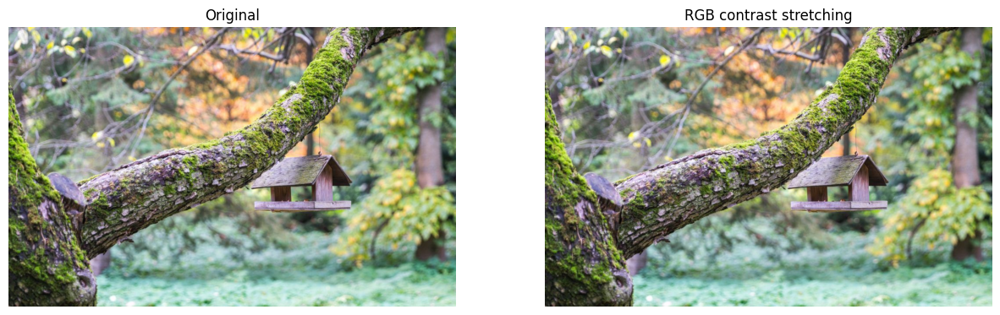

In [9]:
# R contrast stretching
mn = min(R.flatten())
mx = max(R.flatten())
b = int(np.floor(255 / (mx - mn)))
contrast_stretched_R = (R - mn) * b

# G contrast stretching
mn = min(G.flatten())
mx = max(G.flatten())
b = int(np.floor(255 / (mx - mn)))
contrast_stretched_G = (G - mn) * b

# B contrast stretching
mn = min(B.flatten())
mx = max(B.flatten())
b = int(np.floor(255 / (mx - mn)))
contrast_stretched_B = (B - mn) * b

# combine all RGB channel
contrast_stretched_RGB = util.img_as_ubyte(np.zeros(bird_house.shape))
contrast_stretched_RGB[:,:,0] = contrast_stretched_R
contrast_stretched_RGB[:,:,1] = contrast_stretched_G
contrast_stretched_RGB[:,:,2] = contrast_stretched_B

# show image
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(bird_house)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("RGB contrast stretching")
plt.imshow(contrast_stretched_RGB)
plt.axis("off")
plt.show()

Hasil gambar setelah dilakukan contrast stretching pada setiap channel RGB sangat mirip dengan gambar original. Karena nilai pixel minimal pada setiap channel 0 dan nilai maksimumnya adalah 255.

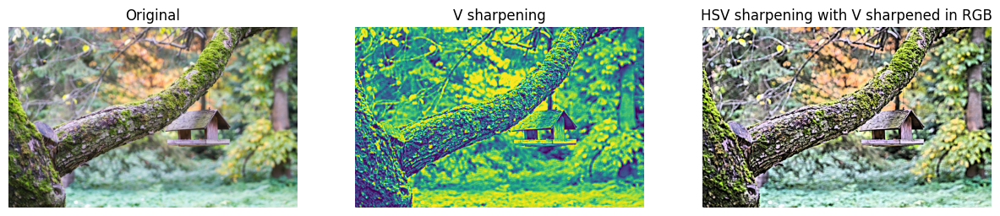

In [10]:
# convert rgb to hsv
HSV = color.rgb2hsv(bird_house)
H = HSV[:,:,0]
S = HSV[:,:,1]
V = HSV[:,:,2]

# sharpen V channel
sharp_V = (filters.unsharp_mask(V, 5, 2))

# combine all HSV channel
sharp_HSV = (np.zeros(HSV.shape))
sharp_HSV[:,:,0] = H
sharp_HSV[:,:,1] = S
sharp_HSV[:,:,2] = sharp_V

# convert back to RGB
RGB_sharp_HSV = color.hsv2rgb(sharp_HSV)

# show image
plt.figure(figsize=(15,10))
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(bird_house)
plt.axis("off")
plt.subplot(1, 3, 2)
plt.title("V sharpening")
plt.imshow(sharp_V)
plt.axis('off')
plt.subplot(1, 3, 3)
plt.title("HSV sharpening with V sharpened in RGB")
plt.imshow(RGB_sharp_HSV)
plt.axis("off")
plt.show()

### d. Terapkan contrast stretching terhadap channel V lalu tampilkan hasilnya sebagai satu citra! Jangan lupa untuk mengubah citra HSV menjadi RGB terlebih dahulu sebelum ditampilkan.

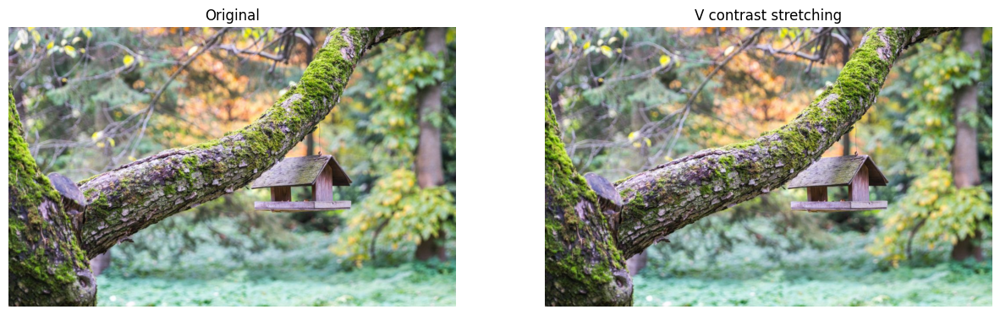

In [11]:
# Contrast stretch V channel
mn = min(V.flatten())
mx = max(V.flatten())
contrast_stretched_V = exposure.rescale_intensity(V, in_range=(mn, mx))

# combine V channel
contrast_stretched_HSV = HSV.copy()
contrast_stretched_HSV[:,:,2] = contrast_stretched_V

# convert back to RGB
contrast_stretched_HSV = color.hsv2rgb(contrast_stretched_HSV)

# show image
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(bird_house)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("V contrast stretching")
plt.imshow(contrast_stretched_HSV)
plt.axis("off")
plt.show()

### e. Ceritakan perbedaan dari citra awal, citra hasil sharpening, dan hasil contrast stretching pada channel RGB dan channel V (gunakan histogram untuk mendukung penjelasan dan argumen anda)

* Channel RGB <br>
Hasil gambar setelah dilakukan contrast stretching pada setiap channel RGB sangat mirip dengan gambar original. Karena nilai pixel minimal pada setiap channel 0 dan nilai maksimumnya adalah 255. Untuk hasil sharpening pada channel RGB, terjadi peningkatan jumlah pixel yang memiliki value mendekati 0 dan 255 pada tiap channel (berdasarkan histogram di bawah) sehingga gambar yang dihasilkan menjadi lebih tajam.

* Channel V <br>
Hasil gambar setelah dilakukan contrast stretching pada channel V sangat mirip dengan gambar original. Untuk hasil sharpening pada channel V, terjadi peningkatan jumlah pixel yang memiliki value mendekati 0.0 dan 1.0 sehingga gambar yang dihasilkan lebih tajam.

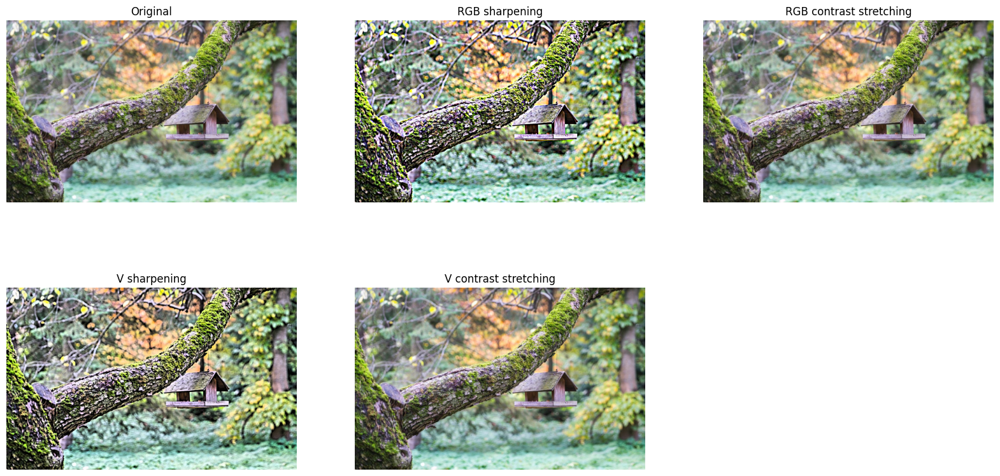

In [12]:
# show all image
plt.figure(figsize=(20,10))
plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(bird_house)
plt.axis("off")
plt.subplot(2, 3, 2)
plt.title("RGB sharpening")
plt.imshow(sharp_RGB)
plt.axis("off")
plt.subplot(2, 3, 3)
plt.title("RGB contrast stretching")
plt.imshow(contrast_stretched_RGB)
plt.axis("off")
plt.subplot(2, 3, 4)
plt.title("V sharpening")
plt.imshow(RGB_sharp_HSV)
plt.axis("off")
plt.subplot(2, 3, 5)
plt.title("V contrast stretching")
plt.imshow(contrast_stretched_HSV)
plt.axis("off")
plt.show()

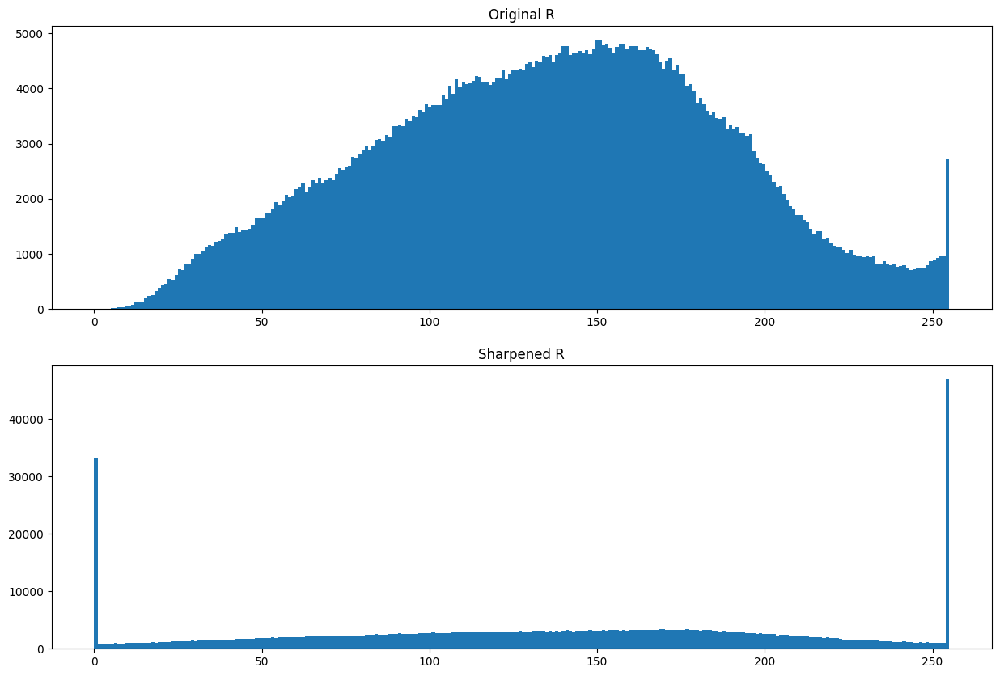

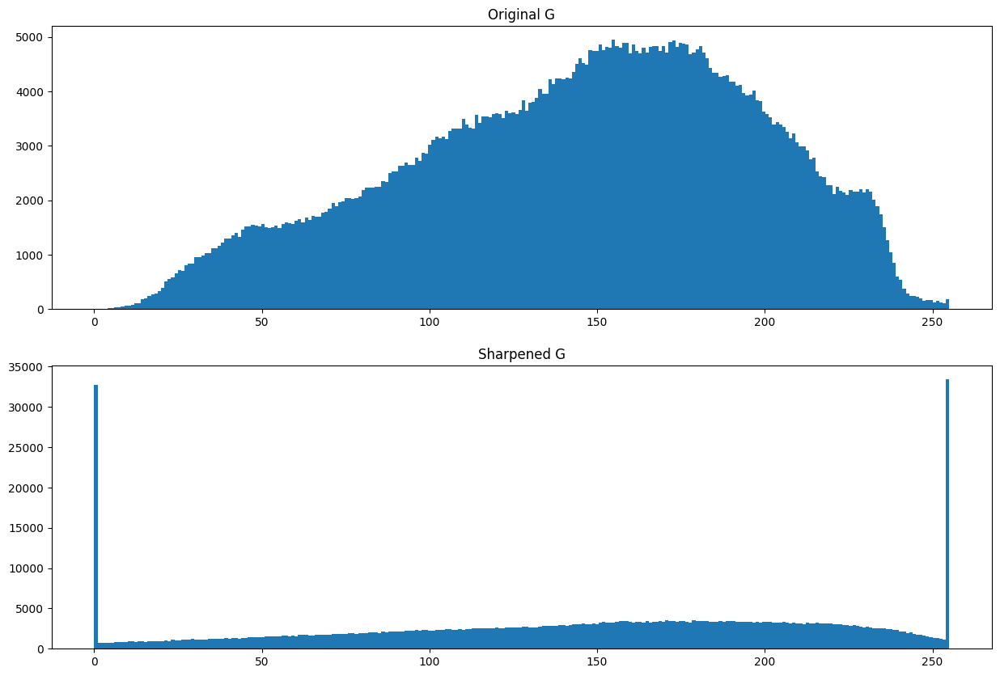

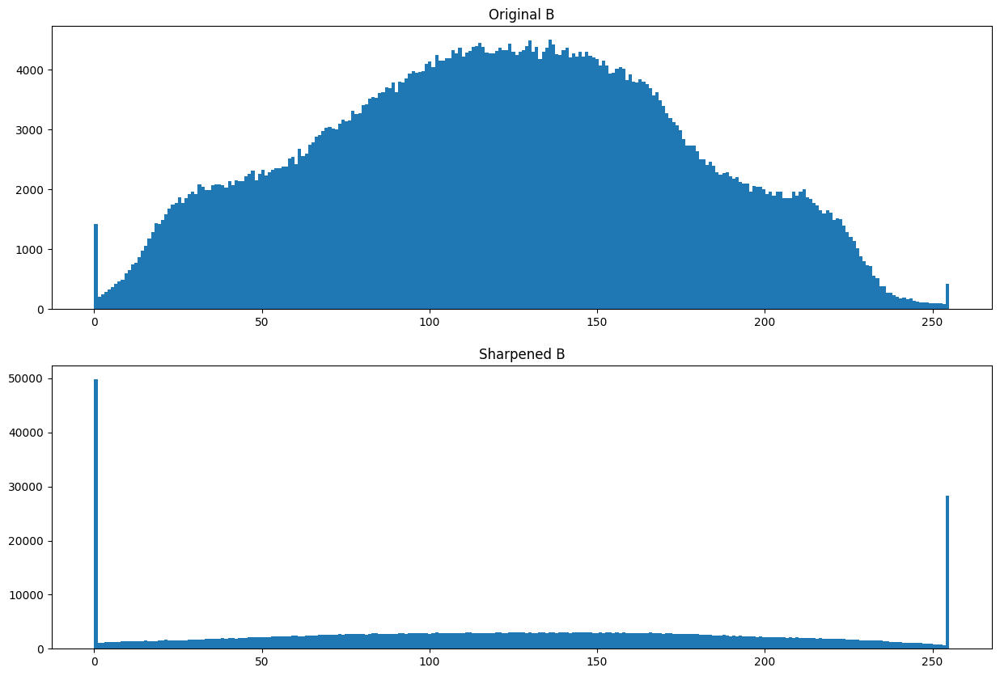

In [13]:
# Original and Sharpening
# R channel comparison
plt.figure(figsize=(15,10))
plt.subplot(2, 1, 1)
plt.title("Original R")
plt.hist(R.flatten(), 256)
plt.subplot(2, 1, 2)
plt.title("Sharpened R")
plt.hist(sharp_R.flatten(), 256)
plt.show()

# G channel comparison
plt.figure(figsize=(15,10))
plt.subplot(2, 1, 1)
plt.title("Original G")
plt.hist(G.flatten(), 256)
plt.subplot(2, 1, 2)
plt.title("Sharpened G")
plt.hist(sharp_G.flatten(), 256)
plt.show()

# B channel comparison
plt.figure(figsize=(15,10))
plt.subplot(2, 1, 1)
plt.title("Original B")
plt.hist(B.flatten(), 256)
plt.subplot(2, 1, 2)
plt.title("Sharpened B")
plt.hist(sharp_B.flatten(), 256)
plt.show()

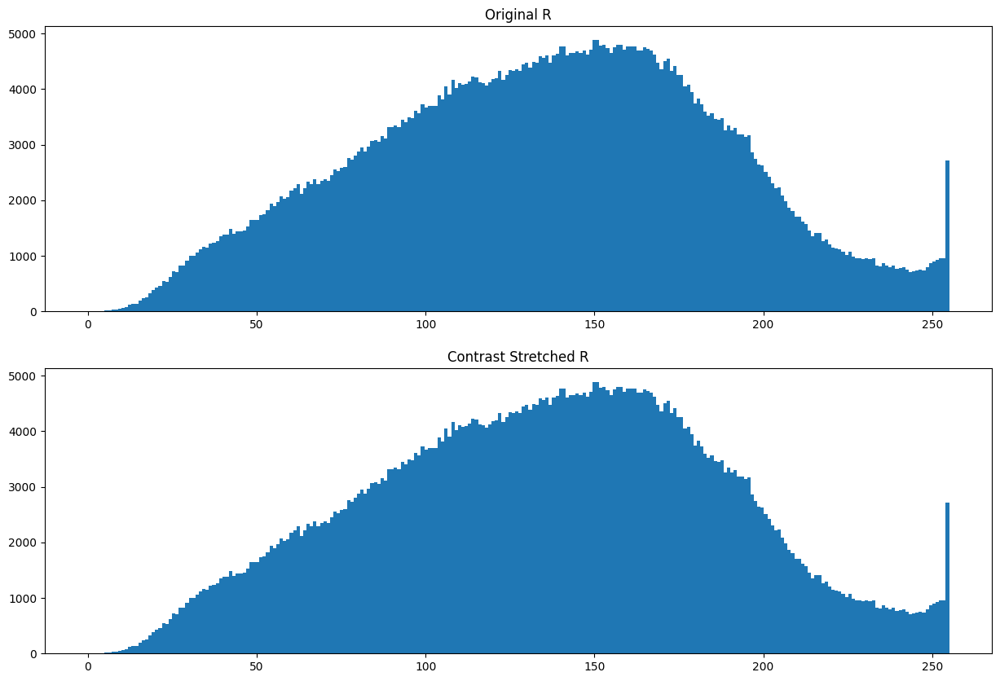

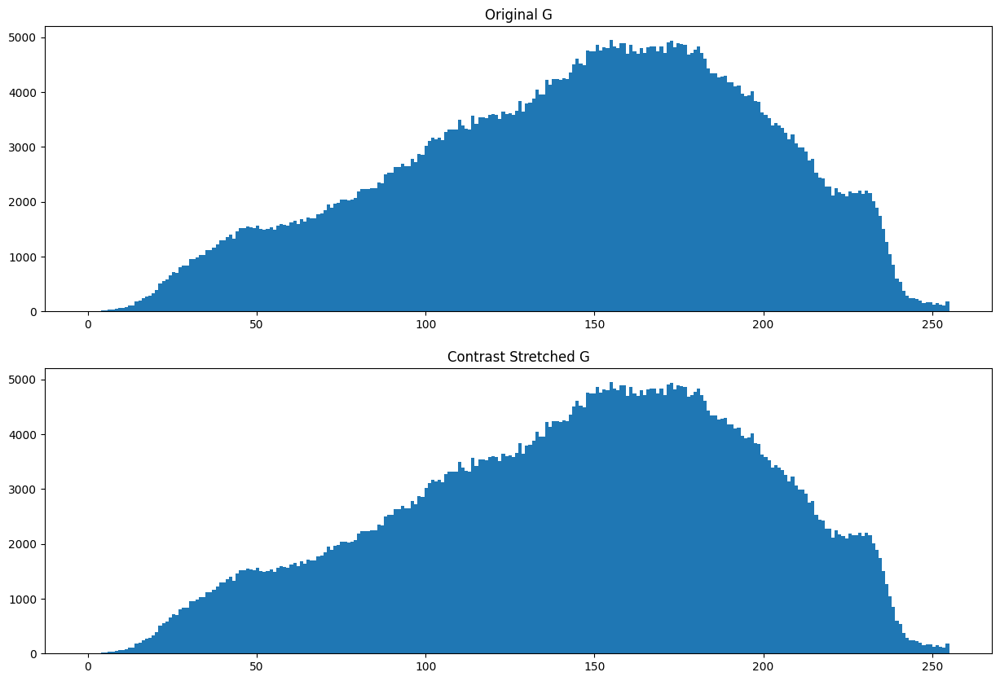

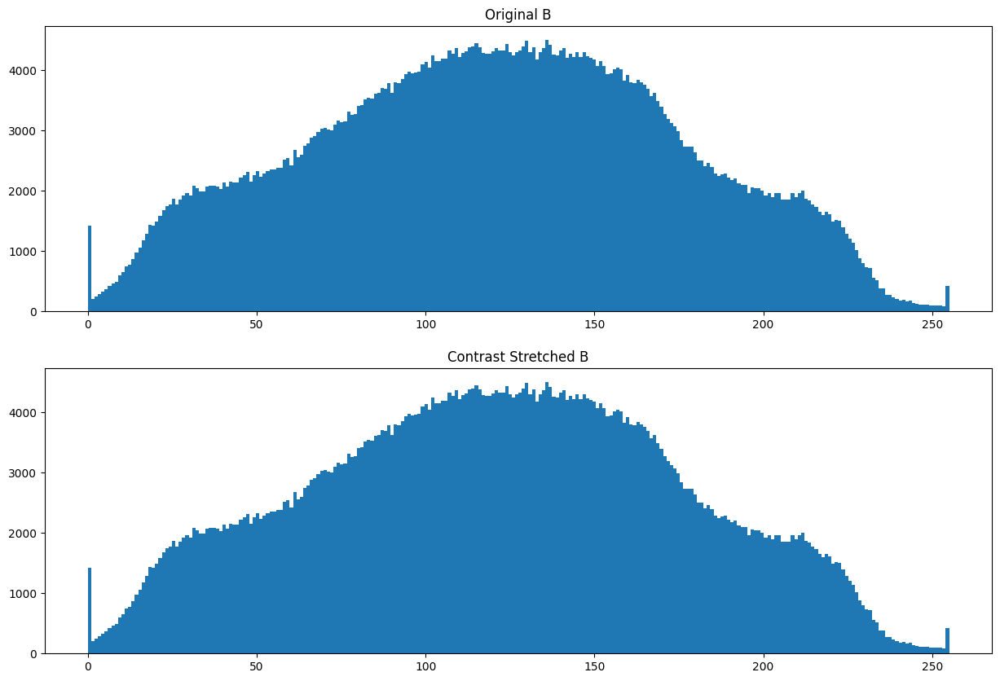

In [14]:
# Original and Contrast Streching
# R channel comparison
plt.figure(figsize=(15,10))
plt.subplot(2, 1, 1)
plt.title("Original R")
plt.hist(R.flatten(), 256)
plt.subplot(2, 1, 2)
plt.title("Contrast Stretched R")
plt.hist(contrast_stretched_R.flatten(), 256)
plt.show()

# G channel comparison
plt.figure(figsize=(15,10))
plt.subplot(2, 1, 1)
plt.title("Original G")
plt.hist(G.flatten(), 256)
plt.subplot(2, 1, 2)
plt.title("Contrast Stretched G")
plt.hist(contrast_stretched_G.flatten(), 256)
plt.show()

# B channel comparison
plt.figure(figsize=(15,10))
plt.subplot(2, 1, 1)
plt.title("Original B")
plt.hist(B.flatten(), 256)
plt.subplot(2, 1, 2)
plt.title("Contrast Stretched B")
plt.hist(contrast_stretched_B.flatten(), 256)
plt.show()

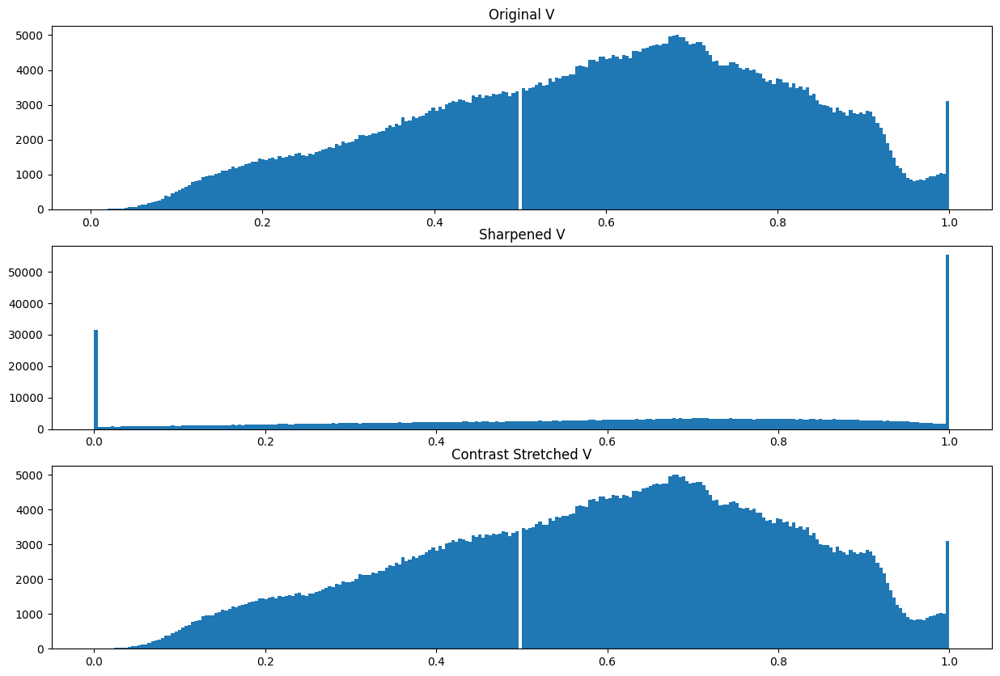

In [15]:
# show V histogram
plt.figure(figsize=(15,10))
plt.subplot(3, 1, 1)
plt.title("Original V")
plt.hist(V.flatten(), 256)
plt.subplot(3, 1, 2)
plt.title("Sharpened V")
plt.hist(sharp_V.flatten(), 256)
plt.subplot(3, 1, 3)
plt.title("Contrast Stretched V")
plt.hist(contrast_stretched_V.flatten(), 256)
plt.show()